In [1]:
import numpy as np
import pandas as pd
import os
from shutil import copyfile
import pickle
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import colorlover as cl


import neuro_morpho_toolbox as nmt
%matplotlib inline
import pickle
pickle_in = open("/home/penglab/FeaCal/all_ns.pickle","rb")
[ns] = pickle.load(pickle_in)


/home/penglab/anaconda3/lib/python3.7/site-packages/neuro_morpho_toolbox-0.1-py3.7.egg/neuro_morpho_toolbox/
Loading CCF Atlas data...
Loading time: 0.83
Loading CCF brain structure data...
Loading time: 0.00


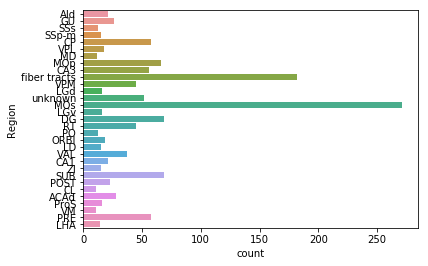

In [2]:
sf = ns.features['soma_features'].region
ct = sf["Region"].value_counts().sort_values(ascending=False)
_ = sns.countplot(y="Region", 
                  data=sf.loc[sf.Region.isin(ct.index[ct>10])],
                 )

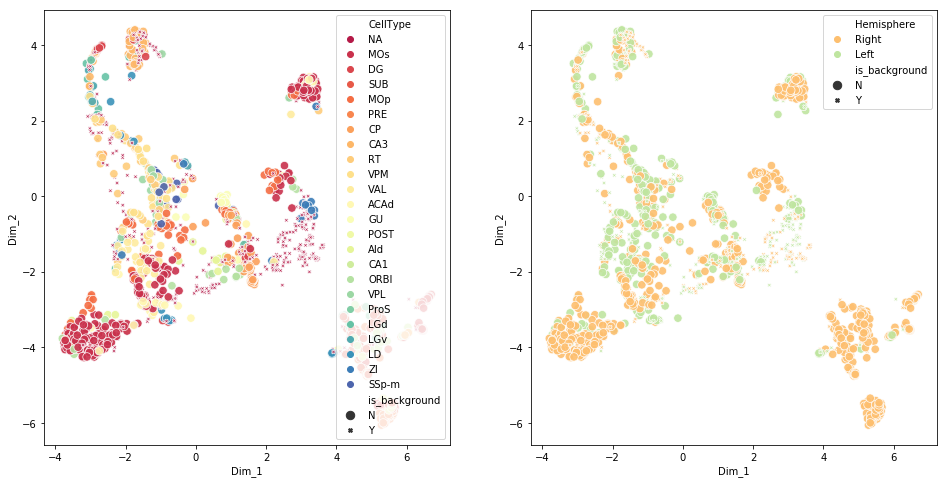

In [3]:
_ = ns.ReduceDimUMAP(feature_set="projection_features", n_neighbors=100)
_ = ns.FeatureScatter(["CellType", "Hemisphere"], map="UMAP")

### Read the downsample-25 array with selected CCF region

In [4]:
pickle_in = open("/home/penglab/NMTcode/ccf_25.pickle","rb")
example_ = pickle.load(pickle_in)
ccfArray= example_[0]

### Read the 6-nearest neighbor 0-1 Contour Matrix 

In [5]:
pickle_in = open("/home/penglab/NMTcode/CCF_6_01.pickle","rb")
example_ = pickle.load(pickle_in)
CCF_6_01= example_[0]==1

### Read the 6-nearest neighbor Contour Matrix with CCF index on

Originally, CCF has 316 regions, after using all the CCF index to replace the child region, there are 337 regions/
Besides, there are 23 regions that show up in the nrrd array but have not been mentioned in CCF or its child region

In [6]:
pickle_in = open("/home/penglab/NMTcode/CCF_6_M.pickle","rb")
example_ = pickle.load(pickle_in)
CCF_6_M = example_[0]

### function writeNRRD(input_M, IDlist, path, flipF = True)
* **input_M** is a sparse matrix, with value indicating ID on each point(mostly 0)
* **IDlist** is a list of ID to output
* **path** is the path to store, do not need to end with '/'
* **flipF** indicates whether illustrate half part of the result or to illustrate the full result

In [7]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import os
import shutil

def writeNRRD(input_M, IDlist, path, flipF = True):
    assert type(IDlist) ==list, "Please using list to input the interested regionID"
    folder = os.path.exists(path)
    if not folder:         
        os.makedirs(path)  
    data = np.zeros(input_M.shape)
    for iterID in IDlist:
        data[input_M==iterID]=1
    filename = str(path)+ '/'
    for iterID in IDlist:
        filename = filename + str(iterID)
        filename = filename + '_'
    filename = filename +'.nrrd'
    itkimage = sitk.GetImageFromArray(data, isVector=False)
    sitk.WriteImage(itkimage, filename, True) 
    co_1,co_2,co_3 = np.where(data ==1)
    if flipF:
        co_1 = co_1[co_3<=nmt.annotation.size['z']//2]
        co_2 = co_2[co_3<=nmt.annotation.size['z']//2]
        co_3 = co_3[co_3<=nmt.annotation.size['z']//2]
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    # Plot defining corner points
    ax.plot(co_1, co_2,co_3, "y.")
    # Make axis label
    for i in ["x", "y", "z"]:
        eval("ax.set_{:s}label('{:s}')".format(i, i))
    plt.show()


writeNRRD(CCF_6_M ,[985] ,'/home/penglab/NMTcode/nrrdTEST',True)

### function disCal(SOMA_raw,Contour_Matrix, flipF = True, near_n)

calculate the distance among region contour, record the nearest near_n
* **SOMA_raw** input dataframe of soma feature: 
* **Contour_Matrix** =1 for contour points, = 0 for others
* **near_n** number of closest contour points to record
* **flipF** flag to indicate whether flip the soma location or not. Defalt is True

Return
* DataFrame with columns ['x', 'y', 'z', 'SqEuclidean', 'min_Euclidean']


In [100]:
from scipy.spatial import distance
import ast
import time
def disCal(SOMA_raw,Contour_01,Array_ID, near_n, flipF = True):
    assert near_n>0, "The number of nearest contour points should be bigger than 0"
    start = time.time()
    scaledDF = pd.DataFrame()
    scaledDF["x"] = (SOMA_raw["x"] / nmt.annotation.space["x"]).copy()
    scaledDF["y"] = (SOMA_raw["y"] / nmt.annotation.space["y"]).copy()
    scaledDF["z"] = (SOMA_raw["z"] / nmt.annotation.space["z"]).copy()
    #flip the somalocation
    if flipF:
        scaledDF["z"][scaledDF['z']>(nmt.annotation.size["z"]//2)] = scaledDF["z"][scaledDF["z"]>(nmt.annotation.size['z']//2)] -nmt.annotation.size["z"]//2 
    i_p = 0
    for idx in scaledDF.index.tolist():
        i_p = i_p+1
        tempCoor = np.array([[scaledDF.loc[idx,'x'],scaledDF.loc[idx,'y'],scaledDF.loc[idx,'z']]])
        tempID = Array_ID[int(scaledDF.loc[idx,'x']),int(scaledDF.loc[idx,'y']),int(scaledDF.loc[idx,'z'])]
        coords = []
        if tempID == 0:
            scaledDF.loc[idx,'SqEuclidean'] = str([0])
            scaledDF.loc[idx,'min_Euclidean'] = 0.
            scaledDF.loc[idx,'mean_Euclidean'] = 0.
            continue
        Mask_temp = np.multiply(Array_ID == tempID,Contour_01)#Contour for this tempID
        co_1_temp,co_2_temp,co_3_temp = np.where( Mask_temp >0)
        for icoor in range(len(co_1_temp)):
            coords.append([co_1_temp[icoor], co_2_temp[icoor], co_3_temp[icoor]])
        zs = np.sort(distance.cdist(tempCoor,coords, 'sqeuclidean'))[0,0:min(near_n,distance.cdist(tempCoor,coords, 'sqeuclidean').shape[1])]
        scaledDF.loc[idx,'SqEuclidean'] = str(zs.tolist())
        scaledDF.loc[idx,'min_Euclidean'] = np.sqrt(float(scaledDF.loc[idx,'SqEuclidean'].strip('[]').split(",")[0]))
        scaledDF.loc[idx,'mean_Euclidean'] = np.mean(zs)
        if i_p%10 ==0:
            print('Load progress: %.5f'% (i_p/scaledDF.shape[0]))
    end = time.time()
    print("Total loading time: %.2f" % (end-start))
    scaledDF = scaledDF.fillna(str([0]))
    #scaledDF['min_Euclidean'] = scaledDF.min_Euclidean.astype(float)
    return scaledDF.copy()

In [ ]:
pickle_in = open("/home/penglab/NMTcode/somaDis.pickle","rb")
example_ = pickle.load(pickle_in)
somaDis = example_[0]

somaDis = disCal(ns.features['soma_features'].raw_data,CCF_6_01,ccfArray,10 ,flipF = True)
pickle.dump([somaDis], open("/home/penglab/NMTcode/somaDis.pickle", "wb"))

### 1171 neurons having soma located inside the regions: selectedDF

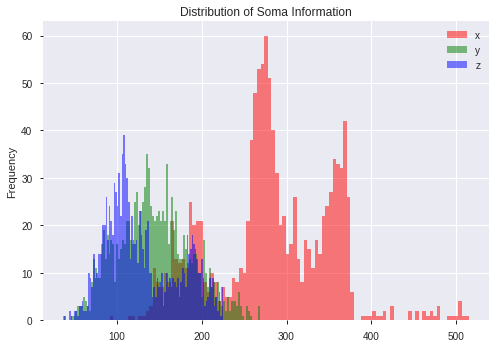

In [104]:
selectedDF = somaDis[somaDis['SqEuclidean'] != str([0])].copy()
selectedDF.loc[:, 'min_Euclidean'] = selectedDF.min_Euclidean.astype(float)

x1 = selectedDF.loc[:, 'x']
x2 = selectedDF.loc[:, 'y']
x3 = selectedDF.loc[:, 'z']
x4 = selectedDF.loc[:, 'min_Euclidean']
x5 = selectedDF.loc[:, 'mean_Euclidean']
assert 'O' not in [x1.dtype, x2.dtype, x3.dtype],"The data type of input series should not be object"
kwargs = dict(alpha=0.5, bins=100)

plt.hist(x1, **kwargs, color='r', label='x')
plt.hist(x2, **kwargs, color='g', label='y')
plt.hist(x3, **kwargs, color='b', label='z')
plt.gca().set(title='Distribution of Soma Information', ylabel='Frequency')
#plt.xlim(50,75)
plt.legend();


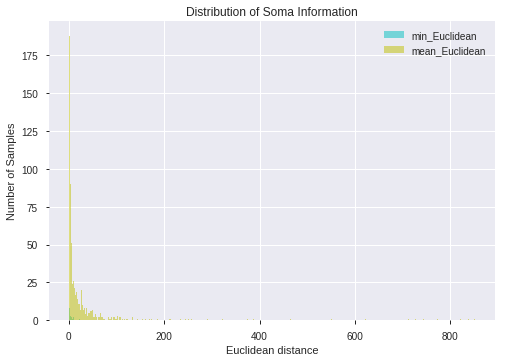

In [110]:

assert 'O' not in [x1.dtype, x2.dtype, x3.dtype, x4.dtype],"The data type of input series should not be object"
kwargs = dict(alpha=0.5, bins=800)

plt.hist(x4, **kwargs, color='c', label='min_Euclidean')
plt.hist(x5, **kwargs, color='y', label='mean_Euclidean')
plt.gca().set(title='Distribution of Soma Information', ylabel='Number of Samples', xlabel = 'Euclidean distance')
#plt.xlim(50,75)
plt.legend();

### 416 neurons having soma located outside the regions: zeroDF

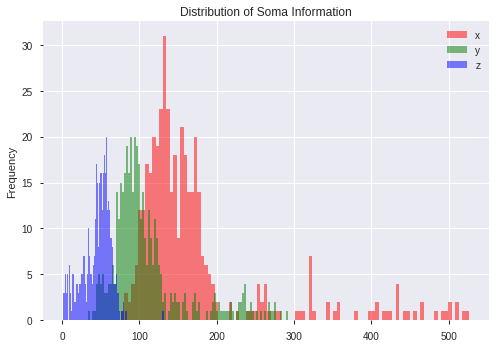

In [111]:

zeroDF.loc[:, 'min_Euclidean'] = zeroDF.min_Euclidean.astype(float)
x1_0 = zeroDF.loc[:, 'x']
x2_0 = zeroDF.loc[:, 'y']
x3_0 = zeroDF.loc[:, 'z']
x4_0 = zeroDF.loc[:, 'min_Euclidean']

assert 'O' not in [x1_0.dtype, x2_0.dtype, x3_0.dtype, x4_0.dtype],"The data type of input series should not be object"
kwargs = dict(alpha=0.5, bins=100)

plt.hist(x1_0, **kwargs, color='r', label='x')
plt.hist(x2_0, **kwargs, color='g', label='y')
plt.hist(x3_0, **kwargs, color='b', label='z')
plt.gca().set(title='Distribution of Soma Information', ylabel='Frequency')
#plt.xlim(50,75)
plt.legend();


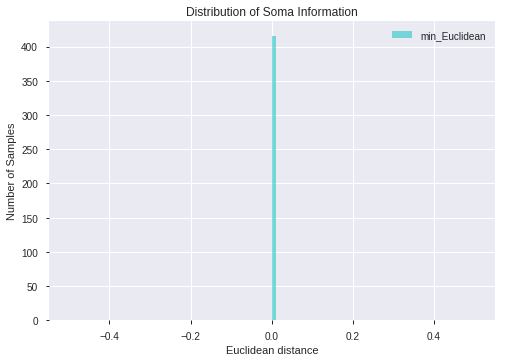

In [114]:

assert 'O' not in [x1_0.dtype, x2_0.dtype, x3_0.dtype, x4_0.dtype],"The data type of input series should not be object"
kwargs = dict(alpha=0.5, bins=100)

plt.hist(x4_0, **kwargs, color='c', label='min_Euclidean')
plt.gca().set(title='Distribution of Soma Information', ylabel='Number of Samples', xlabel = 'Euclidean distance')
#plt.xlim(50,75)
plt.legend();


### Generate the dataframe in pickCLUSTERpara(method)

In [85]:
from sklearn import metrics
from random import randrange
def pickCLUSTERpara(method,selected_list):
    if len(selected_list) >0:
        print('Will calculate ARI for '+ str(len(selected_list) ) + ' neurons')
    result_DF = pd.DataFrame()
    method_list = ['kmeans','snn','hdbscan','hierarchy','dbscan']
    assert method in method_list, "Should be one of "+str(method_list)
    colname = ['ARI','NumCluster','parameter']
    if method.lower() == 'hierarchy':
        #%% Store the result of Hierarchy
        result_hier = pd.DataFrame(columns = colname)
        L_method_list=['single', 'complete','average','weighted','centroid','median','ward']
        L_metric_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
                       'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
                       'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
                       'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']

        criterionH_list=['inconsistent','distance','maxclust','monocrit','maxclust_monocrit']

        hier_dict={'L_method':'single', 'L_metric':'euclidean','criterionH':'inconsistent', 'depth':2,'R':None,
                   't':0.9,'optimal_ordering':False,'colR':3}
        for L_methodidx in L_method_list:
            hier_dict.update(L_method = L_methodidx)
            for L_metricidx in L_metric_list:
                hier_dict.update(L_metric = L_metricidx )
                # so far the parameter to generate the linkage array is set
                if L_methodidx == 'centroid' or L_methodidx == 'median' or L_methodidx == 'ward':
                    if L_metricidx != 'euclidean':
                        continue         
                for criterionidx in criterionH_list:
                    hier_dict.update(criterionH = criterionidx )   
                    if criterionidx == 'inconsistent' or criterionidx == 'distance':
                        for t_iter in  np.arange(0,1.6,0.05)  : 
                            hier_dict.update(t = t_iter) 
                            if criterionidx == 'inconsistent':
                                for depth_iter in range(2,16):
                                    hier_dict.update(depth = depth_iter) 
                                    _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                                    if len(selected_list)==0:
                                        selected_list = ns.metadata.index.tolist()
                                    tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                                    tempDF = pd.DataFrame([tempARI, 
                                                           len(list(ns.metadata.groupby('Cluster'))),
                                                           str(hier_dict)]).T.copy()
                                    tempDF.columns=colname
                                    print(str(hier_dict))
                                    result_hier = result_hier.append(tempDF) 
                            elif criterionidx == 'distance':
                                _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                                tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                                tempDF = pd.DataFrame([tempARI, 
                                                       len(list(ns.metadata.groupby('Cluster'))),
                                                       str(hier_dict)]).T.copy()
                                tempDF.columns=colname
                                print(str(hier_dict))
                                result_hier = result_hier.append(tempDF) 
                    if criterionidx == 'maxclust' or criterionidx == 'maxclust_monocrit':
                        for t_iter in  range(20,51): 
                            hier_dict.update(t = t_iter) 
                            _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                            tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                            tempDF = pd.DataFrame([tempARI, 
                                                   len(list(ns.metadata.groupby('Cluster'))),
                                                   str(hier_dict)]).T.copy()
                            tempDF.columns=colname
                            print(str(hier_dict))
                            result_hier = result_hier.append(tempDF) 
                               
        idx_hier = ['Hier'+str(x) for x in range(result_hier.shape[0])]    
        result_hier['idx'] = idx_hier
        result_hier.set_index('idx',inplace=True)  
        result_DF = result_hier.copy()
        
    if method.lower() == 'kmeans':
        result_kmeans = pd.DataFrame(columns = colname)
        init_list=['k-means++','random']
        algorithm_list = ['auto','full','elkan']
        precompute_distances_list = ['auto', True, False]
        n_init_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
                       'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
                       'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
                       'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
        criterionH_list='inconsistent','distance','maxclust','monocrit','maxclust_monocrit'
        kmeans_dict={'n_clusters':20, 'init':'k-means++', 'n_init':10, 'max_iter':300, 'tol':0.0001,
                     'precompute_distances':'auto', 'verbose':0, 'random_state':None,'copy_x': True,
                     'n_jobs':12, 'algorithm':'auto'}
        for init_idx in init_list:
            kmeans_dict.update(init = init_idx)
            for algorithm_idx in algorithm_list:
                kmeans_dict.update(algorithm = algorithm_idx )
                for precompute_distances_idx in precompute_distances_list:
                    kmeans_dict.update(precompute_distances = precompute_distances_idx )
                    for n_clustersidx in range(3,45):
                        kmeans_dict.update(n_clusters = n_clustersidx)     
                        for n_initidx in range(7,15):
                            kmeans_dict.update(n_init = n_initidx) 
                            for tol_idx in np.exp(-np.arange(2,4,0.2)):
                                kmeans_dict.update(tol = tol_idx) 
                                print(kmeans_dict)
                                _ = ns. get_clusters(method='Kmeans',karg_dict=kmeans_dict)
                                tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                                tempDF = pd.DataFrame([tempARI, 
                                                       len(list(ns.metadata.groupby('Cluster'))),
                                                       str(kmeans_dict)]).T.copy()
                                tempDF.columns=colname
                                print(str(kmeans_dict))
                                result_kmeans = result_kmeans.append(tempDF)         
        idx_kmeans = ['KMeans'+str(x) for x in range(result_kmeans.shape[0])]    
        result_kmeans['idx'] = idx_kmeans
        result_kmeans.set_index('idx',inplace=True)       
        result_DF = result_kmeans.copy()
        
    if method.lower() == 'dbscan':
        result_dbscan = pd.DataFrame(columns = colname)
        algorithm_list = ['auto','ball_tree', 'kd_tree', 'brute']# 
         #
        metriclist = [ 'braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation','euclidean', 'cosine',
                      'dice','hamming', 'jaccard', 'kulsinski', 'matching','minkowski','rogerstanimoto','russellrao','sokalmichener', 'sokalsneath']
        dbscan_dict={'eps':20, 'min_samples':5, 'metric':'euclidean','metric_params':None, 'algorithm':'auto', 
                     'leaf_size':30, 'p':None,'n_jobs':12}
        for algorithm_idx in algorithm_list:
            dbscan_dict.update(algorithm = algorithm_idx )
            for metric_iter in metriclist:
                dbscan_dict.update(metric= metric_iter)
                if algorithm_idx == 'ball_tree' and metric_iter in ['correlation','cosine','sqeuclidean']:
                    continue
                if algorithm_idx == 'kd_tree' and metric_iter not in ['chebyshev', 'cityblock', 'euclidean',
                                                                                   'infinity', 'l1', 'l2', 'manhattan',
                                                                                  'minkowski', 'p']:
                    continue
                if algorithm_idx == 'brute' and metric_iter in ['haversine','wminkowski', 'mahalanobis','infinity']:
                    continue
                if metric_iter in ['wminkowski', 'minkowski']:
                    p_iter =randrange(1,10)
                    dbscan_dict.update(p = p_iter)
                    while metric_iter == 'minkowski' and p_iter == 1:
                        p_iter =randrange(2,10)
                        dbscan_dict.update(p = p_iter)
                for epsidx in np.exp(-np.arange(0,4,0.5)):
                    dbscan_dict.update(eps = epsidx)
                    for min_samples_iter in range(5,10):
                        dbscan_dict.update(min_samples = min_samples_iter)
                        for leaf_size_iter in range(25,35):
                            dbscan_dict.update(leaf_size = leaf_size_iter)
                            _ = ns. get_clusters(method='DBSCAN',karg_dict=dbscan_dict)
                            tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                            tempDF = pd.DataFrame([tempARI, len(list(ns.metadata.groupby('Cluster'))),str(dbscan_dict)]).T.copy()
                            tempDF.columns=colname
                            print(str(dbscan_dict))
                            result_dbscan = result_dbscan.append(tempDF)        
        idx_dbscan = ['DBSCAN'+str(x) for x in range(result_dbscan.shape[0])]    
        result_dbscan['idx'] = idx_dbscan
        result_dbscan.set_index('idx',inplace=True)     
        result_DF = result_dbscan.copy()
        
    if method.lower() == 'hdbscan':
        result_hdbscan = pd.DataFrame(columns = colname)
        #
        metric_list = [ 'euclidean','minkowski', 'l2', 'l1', 'manhattan', 'cityblock', 'braycurtis', 'canberra',
                       'chebyshev','correlation','dice', 'hamming', 'jaccard','kulsinski', 'matching', 
                       'rogerstanimoto', 'russellrao','sokalmichener', 'sokalsneath', 'sqeuclidean', 'yule']
        
    
        algorithm_list = ['best', 'generic','prims_kdtree','boruvka_kdtree']#, 
        cluster_selection_method_list = ['leaf','eom']
        hdbscan_dict={'min_cluster_size':5, 'metric':'euclidean','alpha':1.0, 'min_samples':1,
                      'p':2,'algorithm':'best', 'leaf_size':40, 'approx_min_span_tree':True,
                      'gen_min_span_tree':False,'core_dist_n_jobs':4,'cluster_selection_method':'eom',
                      'allow_single_cluster': False,'prediction_data':False,
                      'match_reference_implementation':False}

        for algorithm_idx in algorithm_list:
            hdbscan_dict.update(algorithm = algorithm_idx)
            for metric_idx in metric_list:
                if algorithm_idx=='boruvka_kdtree' and metric_idx in['braycurtis','canberra','dice','hamming',
                                                                     'jaccard','kulsinski','matching','rogerstanimoto',
                                                                     'russellrao','sokalmichener', 'sokalsneath']:
                    continue
                hdbscan_dict.update(metric = metric_idx)
                for cluster_selection_method_idx in cluster_selection_method_list:
                    hdbscan_dict.update(cluster_selection_method = cluster_selection_method_idx )
                    for alpha_idx in np.arange(0.8,1.5,0.1):
                        hdbscan_dict.update(alpha = alpha_idx)
                        for min_samples_iter in range(1,10):
                            hdbscan_dict.update(min_samples = min_samples_iter)
                            #print(hdbscan_dict)
                            _ = ns. get_clusters(method='HDBSCAN',karg_dict=hdbscan_dict)
                            tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
                            tempDF = pd.DataFrame([tempARI, len(list(ns.metadata.groupby('Cluster'))),str(hdbscan_dict)]).T.copy()
                            tempDF.columns = colname
                            print(str(hdbscan_dict))
                            result_hdbscan = result_hdbscan.append(tempDF)     

        idx_hdbscan = ['HDBSCAN'+str(x) for x in range(result_hdbscan.shape[0])]    
        result_hdbscan['idx'] = idx_hdbscan
        result_hdbscan.set_index('idx',inplace=True)       
        result_DF = result_hdbscan.copy()
    if method.lower() == 'snn':
        snn_dict = {'knn':5, 'metric':'minkowski','method':'FastGreedy'}
        result_snn= pd.DataFrame(columns = colname)
        _ = ns. get_clusters(method='SNN_community',
                             karg_dict={'knn':5,
                                        'metric':'minkowski',
                                        'method':'FastGreedy'})
        tempARI = metrics.adjusted_rand_score(ns.metadata.loc[selected_list,'CellType'],
                                                                          ns.metadata.loc[selected_list,'Cluster'])
        tempDF = pd.DataFrame([tempARI, len(list(ns.metadata.groupby('Cluster'))),str(snn_dict)]).T.copy()
        tempDF.columns=colname
        print(str(snn_dict))
        result_snn = result_snn.append(tempDF)
        result_DF = result_snn.copy()
    return result_DF.copy()
    

hier_resultDF = pickCLUSTERpara('hierarchy',se_list)
hier_resultDF.to_excel('/home/penglab/NMTcode/hier_resultDF.xlsx')
kmeans_resultDF = pickCLUSTERpara('kmeans',se_list)
kmeans_resultDF.to_excel('/home/penglab/NMTcode/kmeans_resultDF.xlsx')
dbscan_resultDF = pickCLUSTERpara('dbscan',se_list)
dbscan_resultDF.to_excel('/home/penglab/NMTcode/dbscan_resultDF.xlsx')
hdbscan_resultDF = pickCLUSTERpara('hdbscan',se_list)

hdbscan_resultDF.to_excel('/home/penglab/NMTcode/hdbscan_resultDF.xlsx')
snn_resultDF = pickCLUSTERpara('snn',se_list)
snn_resultDF.to_excel('/home/penglab/NMTcode/snn_resultDF.xlsx')

In [103]:
import pandas_profiling

somaDis.profile_report()

In [119]:
import pandas_profiling

selectedDF.profile_report()

In [81]:
se_list = selectedDF.index.tolist()

In [170]:
import pandas as pd
hier_resultDF = pd.read_excel('/home/penglab/NMTcode/hier_resultDF.xlsx', index_col=0)
kmeans_resultDF = pd.read_excel('/home/penglab/NMTcode/kmeans_resultDF.xlsx', index_col=0)
dbscan_resultDF = pd.read_excel('/home/penglab/NMTcode/dbscan_resultDF.xlsx', index_col=0)
hdbscan_resultDF = pd.read_excel('/home/penglab/NMTcode/hdbscan_resultDF.xlsx', index_col=0)
snn_resultDF = pd.read_excel('/home/penglab/NMTcode/snn_resultDF.xlsx', index_col=0)

### Calculate ARI

In [168]:
from scipy.spatial import distance
import ast
def findBESTpara(inputDF,clusterRange,num_return):
    inputDF.drop_duplicates(subset=None, keep='first', inplace=True)
    [minR,maxR] = clusterRange
    inputDF = inputDF[inputDF['NumCluster'] >= minR] 
    inputDF = inputDF[inputDF['NumCluster'] <= maxR] 
    inputDF.sort_values(by=['ARI'], ascending=False, inplace = True)
    maxARI_DF = inputDF[inputDF['ARI']==max(inputDF['ARI'])]
    print('Available parameters are: ')
    if maxARI_DF.shape[0]>num_return:
        for i in maxARI_DF.index:
            print('ARI is ' + str(maxARI_DF.loc[i,'ARI']) + ', and corresponding parameter is '+ str(maxARI_DF.loc[i,'parameter']))
        return maxARI_DF.copy()
    outputDF = inputDF.iloc[:min(inputDF.shape[0],num_return+1),:]
    for i in outputDF.index:
            print(outputDF.loc[i,'parameter'])
    return outputDF.copy()

In [162]:
import pandas_profiling

hier_resultDF.profile_report()


In [163]:
import pandas_profiling

kmeans_resultDF.profile_report()


In [165]:
import pandas_profiling

dbscan_resultDF.profile_report()


In [166]:
import pandas_profiling

hdbscan_resultDF.profile_report()


In [171]:
import pandas_profiling

snn_resultDF.profile_report()


In [169]:
hierbest = findBESTpara(hier_resultDF,[15,45],2)
print('\n')
kmeansbest = findBESTpara(kmeans_resultDF,[15,45],2)
print('\n')
dbscanbest = findBESTpara(dbscan_resultDF,[15,45],2)
print('\n')
hdbscanbest = findBESTpara(hdbscan_resultDF,[15,45],2)
print('\n')
snnbest = findBESTpara(snn_resultDF,[15,45],2)

Available parameters are: 
ARI is 0.2312235303885105, and corresponding parameter is {'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
ARI is 0.2312235303885105, and corresponding parameter is {'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
ARI is 0.2312235303885105, and corresponding parameter is {'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}
ARI is 0.2312235303885105, and corresponding parameter is {'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.8500000000000001, 'optimal_ordering': False, 'colR': 3}


Available parameters are: 
{'n_clusters': 27, 'init': 'random', 'n_init': 9, 'max_iter': 300, 'tol': 0.07427357821433384, 'pre

Available parameters are: 
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 8, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'prims_kdtree', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'predicti

In [149]:
for idx in a.index:
    print(a.loc[idx,'parameter'])

{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9, 'optimal_ordering': False, 'colR': 3}
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 15, 'R': None, 't': 0.9500000000000001, 'optimal_ordering': False, 'colR': 3}
{'L_method': 'median', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 15, 'R': None, 't': 26, 'optimal_ordering': False, 'colR': 3}


In [168]:
aa = 'a a g d s fiber tracts'
aa=aa.replace("fiber tracts", "fiber_tracts")
aa

'a a g d s fiber_tracts'

In [ ]:
np.sum(M_show!=0)

In [ ]:
regionN, count = np.unique(M_show, return_counts=True)
regionN

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull


M_show = np.multiply(nmt.annotation.array.copy(),contour_M_6)

co_1,co_2,co_3 = np.where(M_show ==1016)
#co_1 = co_1[co_3<=nmt.annotation.size['z']//2]
#co_2 = co_2[co_3<=nmt.annotation.size['z']//2]
#co_3 = co_3[co_3<=nmt.annotation.size['z']//2]
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot defining corner points
ax.plot(co_1, co_2,co_3, "b.")

# 12 = 2 * 6 faces are the simplices (2 simplices per square face)


# Make axis label
for i in ["x", "y", "z"]:
    eval("ax.set_{:s}label('{:s}')".format(i, i))

plt.show()


In [ ]:
nmt.bs.id_to_name(507)

In [ ]:
testR = testR.fillna('unknown')
testR.to_excel('/home/penglab/NMTcode/testR.xlsx')

In [ ]:
nmt.annotation.size

In [ ]:
nmt.annotation.space

In [ ]:
nmt.annotation.array.shape

In [ ]:
528* 320* 456